# Opendata Météo-France - Département de la Gironde (33)

## Présentation des données

Données climatologiques de toutes les stations de métropole et d'outre-mer depuis leur ouverture, pour tous les paramètres disponibles. Ces données couvrent la période **1842-2026** pour le département de la Gironde et ont subi un contrôle climatologique.

### Informations techniques

Les données quotidiennes sont proposées en téléchargement, par département, et par lots de période au format CSV compressé.

L'ensemble des paramètres est fourni pour l'ensemble des stations météorologiques.

**Fréquence de mise à jour des fichiers :**
- Annuelle pour les historiques avant 1950
- Mensuelle pour les fichiers de 1950 à 2024
- Quotidienne pour les deux dernières années

Sources:

* https://meteo.data.gouv.fr/datasets/6569b51ae64326786e4e8e1a

Data:

* [QUOT_departement_33_periode_1842-1949_RR-T-Vent](https://www.data.gouv.fr/api/1/datasets/r/bd7854d9-548b-4b3c-bbaa-8586a7060dba)
* [QUOT_departement_33_periode_1950-2024_RR-T-Vent](https://www.data.gouv.fr/api/1/datasets/r/b0e78f3d-9085-4d6d-a47d-6d942f5e9a54)
* [QUOT_departement_33_periode_2024-2026_RR-T-Vent](https://www.data.gouv.fr/api/1/datasets/r/5f196a76-ba4f-4aa7-af28-eff6c8797b50)



In [1]:
import os
import urllib.request

from siba import DATA_DIR, RESULTS_DIR

# Chemins ancrés sur la racine du dépôt, pas sur le répertoire courant
DATA_FOLDER = str(DATA_DIR)
DOWNLOAD_URLS = [
    "https://www.data.gouv.fr/api/1/datasets/r/bd7854d9-548b-4b3c-bbaa-8586a7060dba",
    "https://www.data.gouv.fr/api/1/datasets/r/b0e78f3d-9085-4d6d-a47d-6d942f5e9a54",
    "https://www.data.gouv.fr/api/1/datasets/r/5f196a76-ba4f-4aa7-af28-eff6c8797b50",
]

def download_file(url, dest_folder):
    if not os.path.exists(dest_folder):
        os.makedirs(dest_folder)
    try:
        req = urllib.request.Request(url)
        with urllib.request.urlopen(req) as response:
            file_path = os.path.join(dest_folder, response.url.split('/')[-1])
            if not os.path.exists(file_path):
                with open(file_path, 'wb') as out_file:
                    data = response.read()
                    out_file.write(data)
                print(f"Downloaded {response.url} into {dest_folder}")
            else:
                print(f"File {file_path} already exists, skipping download.")
    except Exception as e:
        print(f"Failed to download {url}: {e}")

for url in DOWNLOAD_URLS:
    download_file(url, DATA_FOLDER)

Failed to download https://www.data.gouv.fr/api/1/datasets/r/bd7854d9-548b-4b3c-bbaa-8586a7060dba: HTTP Error 404: NOT FOUND


File /home/yml/Dropbox/Devs/siba_dataviz/_data/Q_33_previous-1950-2024_RR-T-Vent.csv.gz already exists, skipping download.


File /home/yml/Dropbox/Devs/siba_dataviz/_data/Q_33_latest-2025-2026_RR-T-Vent.csv.gz already exists, skipping download.


In [2]:
import gzip
import shutil

def uncompress_gz_files(folder):
    for root, _, files in os.walk(folder):
        for file in files:
            if file.endswith(".csv.gz"):
                gz_file_path = os.path.join(root, file)
                csv_file_path = os.path.join(root, file[:-3])  # Remove the .gz extension

                if not os.path.exists(csv_file_path):
                    with gzip.open(gz_file_path, 'rb') as f_in:
                        with open(csv_file_path, 'wb') as f_out:
                            shutil.copyfileobj(f_in, f_out)
                    print(f"Uncompressed {gz_file_path} to {csv_file_path}")
                else:
                    print(f"File {csv_file_path} already exists, skipping uncompression.")


uncompress_gz_files(DATA_FOLDER)

File /home/yml/Dropbox/Devs/siba_dataviz/_data/Q_33_1842-1949_RR-T-Vent.csv already exists, skipping uncompression.
File /home/yml/Dropbox/Devs/siba_dataviz/_data/Q_33_previous-1950-2024_RR-T-Vent.csv already exists, skipping uncompression.
File /home/yml/Dropbox/Devs/siba_dataviz/_data/Q_33_latest-2025-2026_RR-T-Vent.csv already exists, skipping uncompression.


### Q_descriptif_champs_RR-T-Vent.csv

```
NUM_POSTE   : numéro Météo-France du poste sur 8 chiffres
NOM_USUEL   : nom usuel du poste
LAT         : latitude, négative au sud (en degrés et millionièmes de degré)
LON         : longitude, négative à l’ouest de GREENWICH (en degrés et millionièmes de degré)
ALTI        : altitude du pied de l'abri ou du pluviomètre si pas d'abri (en m)
AAAAMMJJ    : date de la mesure (année mois jour)
RR          : quantité de précipitation tombée en 24 heures (de 06h FU le jour J à 06h FU le jour J+1). La valeur relevée à J+1 est affectée au jour J (en mm et 1/10)
TN          : température minimale sous abri (en °C et 1/10)
HTN         : heure de TN (hhmm)
TX          : température maximale sous abri (en °C et 1/10)
HTX         : heure de TX (hhmm)
TM          : moyenne quotidienne des températures horaires sous abri (en °C et 1/10)
TNTXM       : moyenne quotidienne (TN+TX)/2 (en °C et 1/10)
TAMPLI      : amplitude thermique quotidienne : écart entre TX et TN quotidiens (TX-TN) (en °C et 1/10)
TNSOL       : température quotidienne minimale à 10 cm au-dessus du sol (en °C et 1/10)
TN50        : température quotidienne minimale à 50 cm au-dessus du sol (en °C et 1/10)
DG          : durée de gel sous abri (T ≤ 0°C) (en mn)
FFM         : moyenne quotidienne de la force du vent moyenné sur 10 mn, à 10 m (en m/s et 1/10)
FF2M        : moyenne quotidienne de la force du vent moyenné sur 10 mn, à 2 m (en m/s et 1/10)
FXY         : maximum quotidien de la force maximale horaire du vent moyenné sur 10 mn, à 10 m (en m/s et 1/10)
DXY         : direction de FXY (en rose de 360)
HXY         : heure de FXY (hhmm)
FXI         : maximum quotidien de la force maximale horaire du vent instantané, à 10 m (en m/s et 1/10)
DXI         : direction de FXI (en rose de 360)
HXI         : heure de FXI (hhmm)
FXI2        : maximum quotidien de la force maximale horaire du vent instantané, à 2 m (en m/s et 1/10)
DXI2        : direction de FXI2 (en rose de 360)
HXI2        : heure de FXI2 (hhmm)
FXI3S       : maximum quotidien de la force maximale horaire du vent moyenné sur 3 s, à 10 m (en m/s et 1/10)
DXI3S       : direction de FXI3S (en rose de 360)
HXI3S       : heure de FXI3S (hhmm)

A chaque donnée est associé un code qualité (ex: T;QT) :
 9 : donnée filtrée (la donnée a passé les filtres/contrôles de premiers niveaux)
 0 : donnée protégée (la donnée a été validée définitivement par le climatologue)
 1 : donnée validée (la donnée a été validée par contrôle automatique ou par le climatologue)
 2 : donnée douteuse en cours de vérification (la donnée a été mise en doute par contrôle automatique)
 
```

## Calcul du nombre de jours "situation inhabituelle" pour le SIBA

### Contexte

Le SIBA (Syndicat Intercommunal du Bassin d'Arcachon) a défini en 2016 un critère de « situation inhabituelle » pour encadrer les rejets d'eaux usées dans le Bassin d'Arcachon.

> Les notions de « fortes pluies » et d' « inondation » manquant de précision et pouvant être sujettes à interprétation, il avait été proposé fin 2016, après une analyse statistique des situations rencontrées lors des différents épisodes pluvieux enregistrés de 2013 à 2016, que soit déclaré au niveau du Bassin d'Arcachon « situation inhabituelle » lorsque les précipitations cumulées sur 7 jours consécutifs dépassent 70 mm.

**Source :** [Plainte ADEBA contre le SIBA](https://adeba.fr/index.php/2023/12/31/plainte-contre-le-siba-pour-pollution-des-eaux-du-bassin/)

### Objectif de cette analyse

Le but de ce notebook est de vérifier le caractère réellement inhabituel du seuil de **70 mm de précipitations cumulées sur 7 jours consécutifs** en analysant les données historiques depuis 1842.


In [3]:
import glob

import pandas as pd

q_33_csv = glob.glob(os.path.join(DATA_FOLDER, "Q_33_*.csv"))

q_33_csv                   

['/home/yml/Dropbox/Devs/siba_dataviz/_data/Q_33_1842-1949_RR-T-Vent.csv',
 '/home/yml/Dropbox/Devs/siba_dataviz/_data/Q_33_previous-1950-2024_RR-T-Vent.csv',
 '/home/yml/Dropbox/Devs/siba_dataviz/_data/Q_33_latest-2025-2026_RR-T-Vent.csv']

In [4]:
df = pd.concat((pd.read_csv(f, delimiter=";") for f in q_33_csv), ignore_index=True)

## Calcul des précipitations cumulées (fenêtres glissantes)

Cette section calcule les précipitations cumulées sur différentes périodes glissantes pour les 4 stations météorologiques du Bassin d'Arcachon (Arcachon, Audenge, Arès, Cap-Ferret) :

- **SLIDING_RR7** : cumul sur 7 jours glissants
- **SLIDING_RR30** : cumul sur 30 jours glissants  
- **SLIDING_RR60** : cumul sur 60 jours glissants

Ces indicateurs permettent d'analyser les tendances pluviométriques à différentes échelles temporelles.


In [5]:
from IPython.display import display
df['DATE'] = pd.to_datetime(df['AAAAMMJJ'], format='%Y%m%d')
df['YEAR'] = df['DATE'].dt.year
df_sorted = df[df['NOM_USUEL'].isin(["ARCACHON", "AUDENGE AGGLOMERATION", "ARES", "CAP-FERRET"])].sort_values(by=['NOM_USUEL', 'DATE'])

df_sorted['SLIDING_RR7'] = df_sorted.groupby('NOM_USUEL')['RR'].rolling(window=7, min_periods=1).sum().reset_index(0, drop=True)
df_sorted['SLIDING_RR30'] = df_sorted.groupby('NOM_USUEL')['RR'].rolling(window=30, min_periods=1).sum().reset_index(0, drop=True)
df_sorted['SLIDING_RR60'] = df_sorted.groupby('NOM_USUEL')['RR'].rolling(window=60, min_periods=1).sum().reset_index(0, drop=True)

df_sorted.describe()



,NUM_POSTE,LAT,LON,ALTI,AAAAMMJJ,RR,QRR,TN,QTN,HTN,...,QHXI3S,DRR,QDRR,STATUS_FXI3S,STATUS_DXI3S,DATE,YEAR,SLIDING_RR7,SLIDING_RR30,SLIDING_RR60
count,9.488400e+04,94884.000000,94884.000000,94884.00000,9.488400e+04,94442.000000,94443.000000,62032.000000,62032.000000,21077.000000,...,19755.000000,4088.000000,4478.000000,618.0,617.000000,94884,94884.000000,94500.000000,94606.000000,94698.000000
mean,3.309553e+07,44.686921,-1.170090,5.04945,1.956762e+07,2.352068,1.254206,9.931216,3.330813,747.069175,...,4.067983,150.856898,8.008486,0.0,0.768233,1957-03-12 00:26:40.809410,1956.695565,16.451584,70.399252,140.581051
min,3.300900e+07,44.630500,-1.251667,2.00000,1.882010e+07,0.000000,1.000000,-13.800000,1.000000,0.000000,...,1.000000,0.000000,1.000000,0.0,0.000000,1882-01-01 00:00:00,1882.000000,0.000000,0.000000,0.000000
25%,3.301100e+07,44.630500,-1.251667,2.00000,1.926081e+07,0.000000,1.000000,6.000000,1.000000,411.000000,...,1.000000,0.000000,9.000000,0.0,1.000000,1926-08-08 18:00:00,1926.000000,2.000000,35.000000,87.400000
50%,3.301100e+07,44.663333,-1.150000,4.00000,1.966081e+07,0.000000,1.000000,10.100000,1.000000,533.000000,...,1.000000,0.000000,9.000000,0.0,1.000000,1966-08-11 12:00:00,1966.000000,10.000000,61.000000,127.800000
75%,3.323600e+07,44.770000,-1.135000,8.00000,1.988112e+07,2.300000,1.000000,14.400000,9.000000,745.000000,...,9.000000,184.000000,9.000000,0.0,1.000000,1988-11-20 00:00:00,1988.000000,24.000000,95.675000,179.700000
max,3.323600e+07,44.770000,-1.013333,8.00000,2.026091e+07,121.100000,9.000000,25.700000,9.000000,2359.000000,...,9.000000,1440.000000,9.000000,0.0,1.000000,2026-09-11 00:00:00,2026.000000,176.000000,408.100000,614.000000
std,1.086387e+05,0.059308,0.073025,2.55905,3.967081e+05,5.074022,1.403228,5.708289,3.635095,611.131145,...,3.890001,265.643712,2.636392,0.0,0.422303,NaN,39.670903,19.123237,47.770453,74.279754


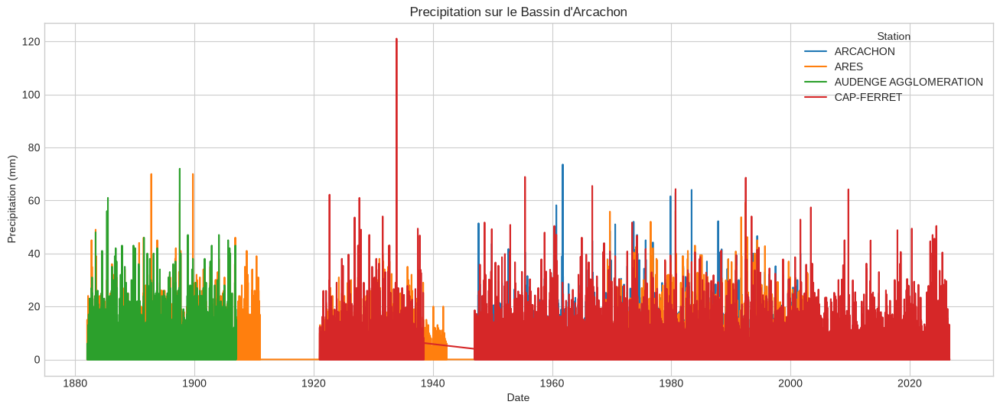

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd


# Use a seaborn theme
plt.style.use('seaborn-v0_8-whitegrid')

fig, ax = plt.subplots(figsize=(16, 6))

for name, group in df_sorted.groupby('NOM_USUEL'):
    ax.plot(group['DATE'], group['RR'], label=name)

ax.set_title("Precipitation sur le Bassin d'Arcachon")
ax.set_xlabel('Date')
ax.set_ylabel('Precipitation (mm)')
ax.legend(title='Station')

plt.savefig(RESULTS_DIR / 'precipitation_ba.png')
plt.show()

In [7]:
import plotly.express as px

fig = px.line(df_sorted, x='DATE', y='RR', color='NOM_USUEL', title='Precipitation sur le Bassin d\'Arcachon')
fig.update_layout(xaxis_title='Date', yaxis_title='Precipitation (mm)', legend_title='Station')
fig.update_layout(width=1200, height=500)
fig.show()


### Commentaire sur les données

Les séries temporelles de Météo-France autour du bassin d'Arcachon ne sont pas complètes sur les 144 ans de l'intervalle (1882-2026). Cependant, grâce aux 4 stations (Arcachon, Arès, Audenge, Cap-Ferret), il est possible de vérifier la cohérence des données et leur relative homogénéité.

**Pour la suite de l'étude, nous concentrerons notre attention sur la station du Cap-Ferret** car elle offre la série la plus complète et la plus fiable sur le dernier siècle.


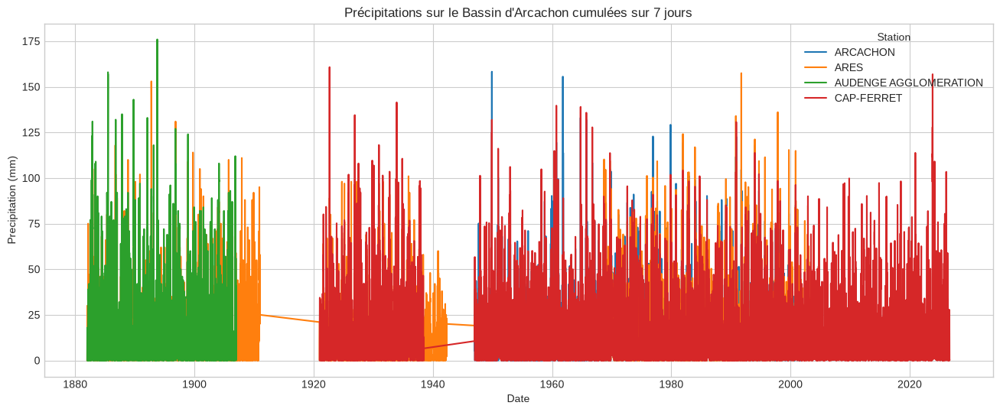

In [8]:
fig, ax = plt.subplots(figsize=(16, 6))

for name, group in df_sorted.groupby('NOM_USUEL'):
    ax.plot(group['DATE'], group['SLIDING_RR7'], label=name)

ax.set_title("Précipitations sur le Bassin d'Arcachon cumulées sur 7 jours")
ax.set_xlabel('Date')
ax.set_ylabel('Precipitation (mm)')
ax.legend(title='Station')

plt.savefig(RESULTS_DIR / 'precipitation_RR7_ba.png')
plt.show()

In [9]:
fig = px.line(df_sorted, x='DATE', y='SLIDING_RR7', color='NOM_USUEL', title='Précipitations sur le Bassin d\'Arcachon cumulées sur 7 jours')
fig.update_layout(xaxis_title='Date', yaxis_title='Precipitation (mm)', legend_title='Station')
fig.update_layout(width=1200, height=500)
fig.show()

In [10]:
print("=== VERIFICATION 1: Maximum RR7 value in 2023 ===")
max_2023 = df_sorted[df_sorted['YEAR'] == 2023]['SLIDING_RR7'].max()
print(f"Maximum SLIDING_RR7 in 2023: {max_2023} mm")

# Find the exact record
record_2023 = df_sorted[df_sorted['YEAR'] == 2023].nlargest(1, 'SLIDING_RR7')[['NOM_USUEL', 'DATE', 'SLIDING_RR7']]
print(f"\nRecord in 2023:")
print(record_2023)

print("\n=== VERIFICATION 2: Events >= 156.9mm (claimed 6 occurrences) ===")
events_over_156 = df_sorted[df_sorted['SLIDING_RR7'] >= 156.9].groupby(['NOM_USUEL', 'YEAR']).size().reset_index(name='COUNT')
print(f"\nTotal station/year combinations with SLIDING_RR7 >= 156.9mm: {len(events_over_156)}")
print(events_over_156)

=== VERIFICATION 1: Maximum RR7 value in 2023 ===
Maximum SLIDING_RR7 in 2023: 156.9 mm

Record in 2023:
          NOM_USUEL       DATE  SLIDING_RR7
1369416  CAP-FERRET 2023-11-04        156.9

=== VERIFICATION 2: Events >= 156.9mm (claimed 6 occurrences) ===

Total station/year combinations with SLIDING_RR7 >= 156.9mm: 7
               NOM_USUEL  YEAR  COUNT
0               ARCACHON  1949      1
1                   ARES  1893      1
2                   ARES  1991      1
3  AUDENGE AGGLOMERATION  1885      2
4  AUDENGE AGGLOMERATION  1893      3
5             CAP-FERRET  1922      1
6             CAP-FERRET  2023      1


### Analyse des événements pluviométriques exceptionnels

La figure précédente montre que le niveau maximal de précipitations cumulées sur 7 jours atteint en 2023 (156,9 mm) a déjà été égalé ou dépassé à **7 reprises** (combinaisons station/année) depuis 1882. Ces événements démontrent que les épisodes pluvieux intenses observés en 2023 ne sont pas inédits et font partie de la variabilité climatique naturelle du Bassin d'Arcachon.




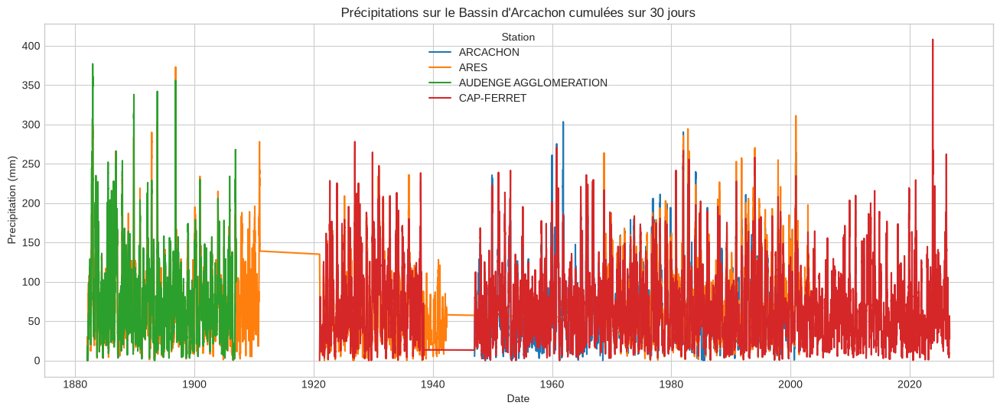

In [11]:
fig, ax = plt.subplots(figsize=(16, 6))

for name, group in df_sorted.groupby('NOM_USUEL'):
    ax.plot(group['DATE'], group['SLIDING_RR30'], label=name)

ax.set_title("Précipitations sur le Bassin d'Arcachon cumulées sur 30 jours")
ax.set_xlabel('Date')
ax.set_ylabel('Precipitation (mm)')
ax.legend(title='Station')

plt.savefig(RESULTS_DIR / 'precipitation_RR30_ba.png')
plt.show()

In [12]:
fig = px.line(df_sorted, x='DATE', y='SLIDING_RR30', color='NOM_USUEL', title='Précipitations sur le Bassin d\'Arcachon cumulées sur 30 jours')
fig.update_layout(xaxis_title='Date', yaxis_title='Precipitation (mm)', legend_title='Station')
fig.update_layout(width=1200, height=500)
fig.show()


### Record de précipitations sur 30 jours glissants

Le mois de novembre 2023 établit un **nouveau record historique** avec 408,1 mm de précipitations cumulées sur 30 jours glissants (mesuré le 15 novembre à la station du Cap-Ferret), dépassant l'ancien record de 377,0 mm observé avant 2023. Ce record représente une augmentation de 8% par rapport au précédent maximum enregistré depuis 1882.


### Vérification des données pour la station Cap-Ferret (2023-2026)

Cette section présente les données détaillées de la station du Cap-Ferret pour les années récentes (2023-2026), permettant une vérification manuelle des événements pluviométriques.

#### Filtrage des données

Le tableau ci-dessous affiche uniquement les jours où les précipitations cumulées sur 7 jours (SLIDING_RR7) sont **supérieures ou égales à 20 mm**. Les lignes surlignées en jaune correspondent aux jours dépassant le seuil de **70 mm** défini par le SIBA comme « situation inhabituelle ».


In [13]:
df_filtered_cap_ferret_2023 = df_sorted[(df_sorted['NOM_USUEL'] == "CAP-FERRET") & (df_sorted['YEAR'] == 2023)][['DATE','RR', 'SLIDING_RR7']]
df_filtered_cap_ferret_2024 = df_sorted[(df_sorted['NOM_USUEL'] == "CAP-FERRET") & (df_sorted['YEAR'] == 2024)][['DATE','RR', 'SLIDING_RR7']]
df_filtered_cap_ferret_2025 = df_sorted[(df_sorted['NOM_USUEL'] == "CAP-FERRET") & (df_sorted['YEAR'] == 2025)][['DATE','RR', 'SLIDING_RR7']]
df_filtered_cap_ferret_2026 = df_sorted[(df_sorted['NOM_USUEL'] == "CAP-FERRET") & (df_sorted['YEAR'] == 2026)][['DATE','RR', 'SLIDING_RR7']]


df_filtered_cap_ferret_2023_2026 = pd.concat([
    df_filtered_cap_ferret_2023,
    df_filtered_cap_ferret_2024, 
    df_filtered_cap_ferret_2025,
    df_filtered_cap_ferret_2026, 
])

# Filter out days where SLIDING_RR7 < 20
df_filtered_cap_ferret_2023_2026 = df_filtered_cap_ferret_2023_2026[df_filtered_cap_ferret_2023_2026['SLIDING_RR7'] >= 20]

def highlight(row):
    if row['SLIDING_RR7'] >= 70:
        return ['background-color: yellow; color: #00008B'] * len(row)
    else:
        return [''] * len(row)

display(df_filtered_cap_ferret_2023_2026.style.apply(highlight, axis=1))

,DATE,RR,SLIDING_RR7
1369117,2023-01-09 00:00:00,0.400000,20.300000
1369118,2023-01-10 00:00:00,1.400000,21.500000
1369119,2023-01-11 00:00:00,0.200000,21.700000
1369120,2023-01-12 00:00:00,3.900000,25.600000
1369121,2023-01-13 00:00:00,0.000000,25.600000
1369123,2023-01-15 00:00:00,16.500000,25.400000
1369124,2023-01-16 00:00:00,22.500000,47.500000
1369125,2023-01-17 00:00:00,5.600000,51.700000
1369126,2023-01-18 00:00:00,10.900000,62.400000
1369127,2023-01-19 00:00:00,23.200000,81.700000


### Nombre d'événements inhabituels par an et par station

Cette analyse compte le nombre de jours par an où le seuil de **70 mm de précipitations cumulées sur 7 jours** a été dépassé, afin de déterminer si ce critère est réellement « inhabituel ».

**Codage couleur :** Les lignes surlignées en orange clair indiquent les années où le nombre de jours dépassant le seuil est **supérieur ou égal à 10**, signalant des années particulièrement pluvieuses.


In [14]:

df_filtered = df_sorted[df_sorted['SLIDING_RR7'] > 70]
days_count = df_filtered.groupby(['NOM_USUEL', 'YEAR']).size().reset_index(name='COUNT')

def highlight(row):
    if row['COUNT'] >= 10:
        return ['background-color: #FFDAB9; color: #00008B'] * len(row)
    else:
        return [''] * len(row)

display(days_count.style.apply(highlight, axis=1))


,NOM_USUEL,YEAR,COUNT
0,ARCACHON,1947,10
1,ARCACHON,1949,10
2,ARCACHON,1950,7
3,ARCACHON,1952,6
4,ARCACHON,1955,3
5,ARCACHON,1958,9
6,ARCACHON,1959,13
7,ARCACHON,1960,22
8,ARCACHON,1961,17
9,ARCACHON,1964,8


In [15]:
fig = px.bar(days_count, x='YEAR', y='COUNT', color='NOM_USUEL', facet_col='NOM_USUEL', facet_col_wrap=1, title='Nombre de jour avec plus de 70mm de précipitation cumulées sur 7j')
fig.update_layout(xaxis_title='Année', yaxis_title='Nombre de jour', legend_title='Station Metéo')
fig.update_layout(width=1200, height=1000)  # Set the width to full and increase the height
fig.show()


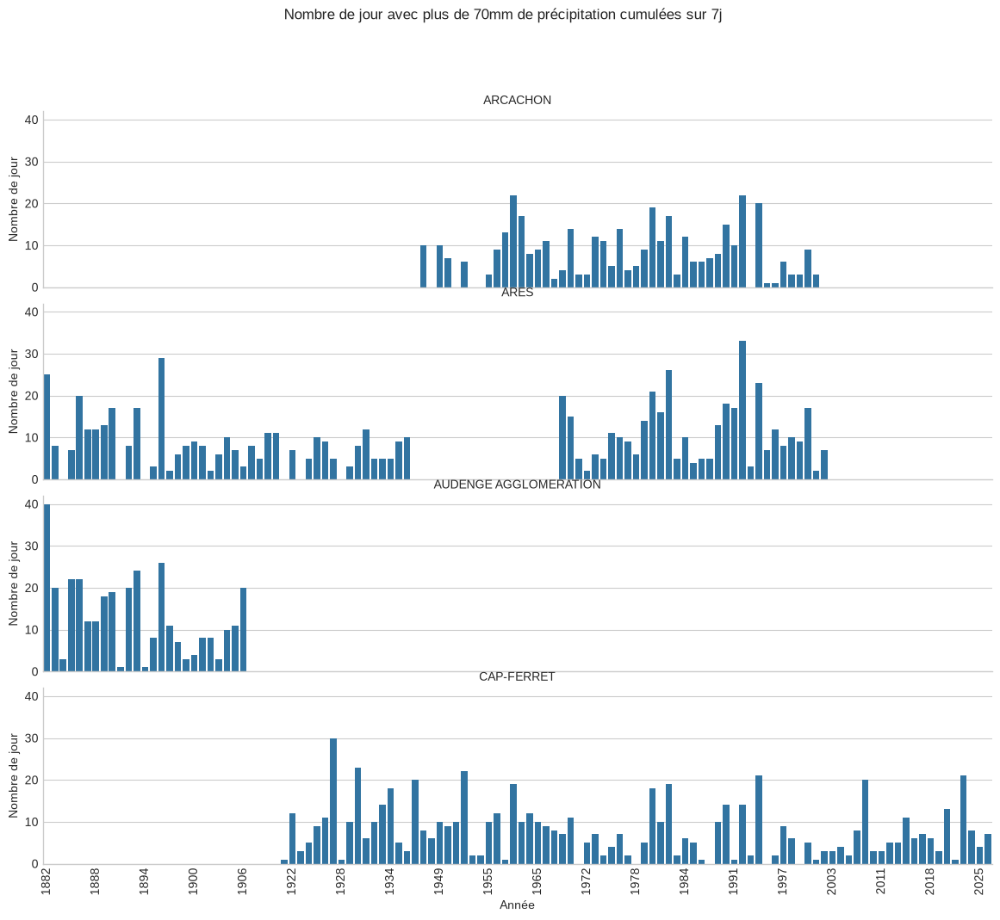

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from matplotlib.ticker import MaxNLocator


# Assuming days_count is already defined
# days_count = pd.read_csv('path_to_your_csv_file.csv')

g = sns.FacetGrid(days_count, col='NOM_USUEL', col_wrap=1, height=5, aspect=2)
g.map_dataframe(sns.barplot, x='YEAR', y='COUNT', order=sorted(days_count['YEAR'].unique()))

g.set_axis_labels('Année', 'Nombre de jour')
g.set_titles(col_template='{col_name}')
g.figure.suptitle('Nombre de jour avec plus de 70mm de précipitation cumulées sur 7j', y=1.02)

# Rotate x-axis labels
for ax in g.axes.flat:
    ax.xaxis.set_major_locator(MaxNLocator(integer=True, prune='lower',nbins=20))
    for label in ax.get_xticklabels():
        label.set_rotation(90)
        label.set_horizontalalignment('center')

plt.subplots_adjust(top=0.9)
g.figure.set_size_inches(12, 10)

plt.savefig(RESULTS_DIR / 'nb_days_plus_de70mm_par_7j_ba.png')
plt.show()

In [17]:
# =============================================================================
# ANALYSE PAR POURCENTAGE - Calculs et statistiques uniquement
# =============================================================================
# Ce code calcule le pourcentage de jours dépassant le seuil de 70mm par an
# plutôt que le simple comptage, permettant une comparaison normalisée
# =============================================================================

import pandas as pd
import numpy as np

# Calcul du pourcentage de jours dépassant le seuil par année
df_cap_ferret = df_sorted[df_sorted['NOM_USUEL'] == "CAP-FERRET"]

yearly_percentage = []
for year in df_cap_ferret['YEAR'].unique():
    year_data = df_cap_ferret[df_cap_ferret['YEAR'] == year]
    total_days = len(year_data)
    days_above_threshold = len(year_data[year_data['SLIDING_RR7'] > 70])
    
    # Ne garder que les années avec au moins 300 jours de données
    if total_days >= 300:
        percentage = (days_above_threshold / total_days) * 100
        yearly_percentage.append({
            'Year': year,
            'Days_Above': days_above_threshold,
            'Total_Days': total_days,
            'Percentage': percentage
        })

df_percentage = pd.DataFrame(yearly_percentage).sort_values('Year')

# ============================================================================
# STATISTIQUES PRINCIPALES
# ============================================================================

print("=" * 80)
print("ANALYSE NORMALISÉE PAR POURCENTAGE - BASSIN D'ARCACHON")
print("Seuil: 70mm de précipitations cumulées sur 7 jours")
print("Station: Cap-Ferret")
print("=" * 80)

# 1. Comparaison historique vs récente
recent = df_percentage[df_percentage['Year'] >= 2015]['Percentage'].mean()
historical = df_percentage[df_percentage['Year'] < 2015]['Percentage'].mean()

print(f"\n1. COMPARAISON NORMALISÉE (retire le biais de longueur d'année):")
print(f"   • Moyenne historique (avant 2015): {historical:.2f}%")
print(f"   • Moyenne récente (2015-2026):     {recent:.2f}%")
print(f"   • Variation: {((recent/historical - 1) * 100):+.1f}%")

# 2. Classement de 2023
year_2023_pct = df_percentage[df_percentage['Year'] == 2023]['Percentage'].values[0]
rank = (df_percentage['Percentage'] > year_2023_pct).sum() + 1

print(f"\n2. CLASSEMENT DE L'ANNÉE 2023:")
print(f"   • Pourcentage: {year_2023_pct:.2f}% des jours ont dépassé le seuil")
print(f"   • Rang: #{rank} sur {len(df_percentage)} années complètes")
print(f"   • Écart vs moyenne historique: {((year_2023_pct / historical) - 1) * 100:+.1f}%")

# 3. Top 10 des années
top10 = df_percentage.nlargest(10, 'Percentage')[['Year', 'Percentage', 'Days_Above']]
print(f"\n3. TOP 10 DES ANNÉES LES PLUS ACTIVES:")
for i, (idx, row) in enumerate(top10.iterrows(), 1):
    print(f"   {i:2d}. {int(row['Year'])}: {row['Percentage']:5.2f}% ({int(row['Days_Above'])} jours)")

# 4. Moyennes par décennie
df_percentage['Decade'] = (df_percentage['Year'] // 10) * 10
decade_stats = df_percentage.groupby('Decade').agg({
    'Percentage': ['mean', 'std', 'min', 'max', 'count']
}).round(2)
decade_stats.columns = ['Moyenne_%', 'Écart-type_%', 'Min_%', 'Max_%', 'Nb_années']

print(f"\n4. STATISTIQUES PAR DÉCENNIE:")
print(decade_stats.to_string())

# 5. Variabilité et distribution
print(f"\n5. ANALYSE DE LA VARIABILITÉ:")
print(f"   • Moyenne globale: {df_percentage['Percentage'].mean():.2f}%")
print(f"   • Écart-type: {df_percentage['Percentage'].std():.2f}%")
print(f"   • Coefficient de variation: {(df_percentage['Percentage'].std() / df_percentage['Percentage'].mean() * 100):.1f}%")
print(f"   • Minimum: {df_percentage['Percentage'].min():.2f}% (année {int(df_percentage.loc[df_percentage['Percentage'].idxmin(), 'Year'])})")
print(f"   • Maximum: {df_percentage['Percentage'].max():.2f}% (année {int(df_percentage.loc[df_percentage['Percentage'].idxmax(), 'Year'])})")
print(f"   • Médiane: {df_percentage['Percentage'].median():.2f}%")

# 6. Années extrêmes
print(f"\n6. ANNÉES EXTRÊMES:")
print(f"   • Années avec 0% (aucun événement): {len(df_percentage[df_percentage['Percentage'] == 0])}")
if len(df_percentage[df_percentage['Percentage'] == 0]) > 0:
    zero_years = df_percentage[df_percentage['Percentage'] == 0]['Year'].values
    print(f"     Années: {', '.join(map(str, sorted(zero_years)[:10]))}")
print(f"   • Années avec >5% des jours: {len(df_percentage[df_percentage['Percentage'] > 5])}")
high_years = df_percentage[df_percentage['Percentage'] > 5]['Year'].values
print(f"     Années: {', '.join(map(str, sorted(high_years)))}")

# 7. Focus sur la période récente (2015-2026)
recent_data = df_percentage[df_percentage['Year'] >= 2015][['Year', 'Days_Above', 'Percentage']].copy()
recent_data['Year'] = recent_data['Year'].astype(int)
recent_data['Days_Above'] = recent_data['Days_Above'].astype(int)
recent_data['Vs_Historique'] = ((recent_data['Percentage'] / historical - 1) * 100).round(1)
recent_data.columns = ['Année', 'Jours>70mm', 'Pourcentage_%', 'Vs_Hist_%']

print(f"\n7. DÉTAIL PÉRIODE RÉCENTE (2015-2026):")
print(f"   Moyenne historique de référence: {historical:.2f}%\n")
print(recent_data.to_string(index=False))

# 8. Analyse par période
print(f"\n8. COMPARAISON PAR PÉRIODE HISTORIQUE:")
periods = {
    'Avant 1950': df_percentage[df_percentage['Year'] < 1950],
    '1950-1999': df_percentage[(df_percentage['Year'] >= 1950) & (df_percentage['Year'] < 2000)],
    '2000-2014': df_percentage[(df_percentage['Year'] >= 2000) & (df_percentage['Year'] < 2015)],
    '2015-2026': df_percentage[df_percentage['Year'] >= 2015]
}

for period_name, period_data in periods.items():
    if len(period_data) > 0:
        mean_pct = period_data['Percentage'].mean()
        std_pct = period_data['Percentage'].std()
        n_years = len(period_data)
        print(f"   {period_name:12s}: Moyenne={mean_pct:5.2f}%  Écart-type={std_pct:4.2f}%  N={n_years:2d} années")

print("\n" + "=" * 80)

ANALYSE NORMALISÉE PAR POURCENTAGE - BASSIN D'ARCACHON
Seuil: 70mm de précipitations cumulées sur 7 jours
Station: Cap-Ferret

1. COMPARAISON NORMALISÉE (retire le biais de longueur d'année):
   • Moyenne historique (avant 2015): 1.95%
   • Moyenne récente (2015-2026):     1.72%
   • Variation: -11.8%

2. CLASSEMENT DE L'ANNÉE 2023:
   • Pourcentage: 5.75% des jours ont dépassé le seuil
   • Rang: #4 sur 96 années complètes
   • Écart vs moyenne historique: +195.7%

3. TOP 10 DES ANNÉES LES PLUS ACTIVES:
    1. 1927:  8.22% (30 jours)
    2. 1930:  6.30% (23 jours)
    3. 1952:  6.01% (22 jours)
    4. 1994:  5.75% (21 jours)
    5. 2023:  5.75% (21 jours)
    6. 1937:  5.48% (20 jours)
    7. 2009:  5.48% (20 jours)
    8. 1982:  5.21% (19 jours)
    9. 1960:  5.19% (19 jours)
   10. 1934:  4.93% (18 jours)

4. STATISTIQUES PAR DÉCENNIE:
        Moyenne_%  Écart-type_%  Min_%  Max_%  Nb_années
Decade                                                  
1920         2.50          2.44   0

## Conclusion

### Remise en question du seuil de 70 mm comme critère d'événement "inhabituel"

L'analyse des données historiques (1882-2026) démontre que le seuil de **70 mm de précipitations cumulées sur 7 jours glissants**, défini par le SIBA comme « situation inhabituelle », ne correspond pas à un événement rare. Les données révèlent que :

- **À la station du Cap-Ferret** : au moins un événement est observé dans la majorité des années (**82 années sur 98**, soit 84%)
- **30 années** ont enregistré **10 événements ou plus** dépassant ce seuil
- Le **record historique** date de 1882 à Audenge avec **40 jours** au-dessus du seuil

### Fréquence des événements pour les années récentes (depuis 2015)

Nombre de jours dépassant le seuil de 70 mm (cumul sur 7 jours) à la station du Cap-Ferret :

| Année | Nombre de jours |
|-------|----------------|
| 2015  | 0 jour         |
| 2016  | 6 jours        |
| 2017  | 7 jours        |
| 2018  | 6 jours        |
| 2019  | 3 jours        |
| 2020  | 13 jours       |
| 2021  | 0 jour         |
| 2022  | 1 jour         |
| 2023  | 21 jours       |
| 2024  | 8 jours        |
| 2025  | 4 jours        |
| 2026  | 7 jours (au 27 février) |

### Absence de tendance à l'augmentation récente

Contrairement à certains discours, l'analyse ne révèle **pas d'explosion du nombre d'événements inhabituels** dans la dernière décennie.

L'année 2023 confirme son caractère exceptionnel en prenant la cinquième place sur le siècle, mais **s'inscrit dans la variabilité naturelle**. L'analyse normalisée par pourcentage **ne montre pas d'augmentation tendancielle** de la fréquence des événements extrêmes sur la période récente (2015-2026), qui reste même légèrement en-dessous de la moyenne historique.

Le coefficient de variation élevé (93%) illustre l'**alternance naturelle** entre années calmes et années très actives, caractéristique du régime pluviométrique du Bassin d'Arcachon.
